# Introduction to Data Science 2025

# Week 2

## Exercise 1 | Titanic: data preprocessing and imputation
<span style="font-weight: bold"> *Note: You can find tutorials for NumPy and Pandas under 'Useful tutorials' in the course material.*</span>

Download the [Titanic dataset](https://www.kaggle.com/c/titanic) [train.csv] from Kaggle or <span style="font-weight: 500">directly from the course material</span>, and complete the following exercises. If you choose to download the dataset from Kaggle, you will need to create a Kaggle account unless you already have one, but it is quite straightforward.

The dataset consists of personal information of all the passengers on board the RMS Titanic, along with information about whether they survived the iceberg collision or not.

1. Your first task is to read the data file and print the shape of the data.

    <span style="font-weight: 500"> *Hint 1: You can read them into a Pandas dataframe if you wish.*</span>
    
    <span style="font-weight: 500"> *Hint 2: The shape of the data should be (891, 12).*</span>

In [41]:
# Use this cell for your code
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
df = pd.read_csv('/home/haarhaar/koulu/Intro to DataScience/Introduction-to-DataScience/Week2/bwHiI8BaXTCixSfbwX5Ja2PQnU63W8.csv')

print(df.shape)

(891, 12)


2. Let's look at the data and get started with some preprocessing. Some of the columns, e.g <span style="font-weight: 500"> *Name*</span>, simply identify a person and are not useful for prediction tasks. Try to identify these columns, and remove them.

    <span style="font-weight: 500"> *Hint: The shape of the data should now be (891, 9).*</span>

In [42]:
# Use this cell for your code
df.drop(columns=["PassengerId", "Name", "Ticket"], errors="ignore", inplace=True)

print(df.shape)


(891, 9)


3. The column <span style="font-weight: 500">*Cabin*</span> contains a letter and a number. A smart catch at this point would be to notice that the letter stands for the deck level on the ship. Keeping just the deck information would be more informative when developing, e.g. a classifier that predicts whether a passenger survived. The next step in our preprocessing will be to add a new column to the dataset, which consists simply of the deck letter. You can then remove the original <span style="font-weight: 500">*Cabin*</span>-column.

<span style="font-weight: 500">*Hint: The deck letters should be ['A' 'B' 'C' 'D' 'E' 'F' 'G' 'T'].*</span>

In [43]:
# Use this cell for your code
df["Deck"] = df["Cabin"].str.split().str[0].str[0]

df["Deck"] = pd.Categorical(df["Deck"], categories=list("ABCDEFGT"))

df = df.drop(columns=["Cabin"])

print(np.sort(df["Deck"].dropna().unique()))

['A' 'B' 'C' 'D' 'E' 'F' 'G' 'T']


4. You’ll notice that some of the columns, such as the previously added deck number, are [categorical](https://en.wikipedia.org/wiki/Categorical_variable). To preprocess the categorical variables so that they're ready for further computation, we need to avoid the current string format of the values. This means the next step for each categorical variable is to transform the string values to numeric ones, that correspond to a unique integer ID representative of each distinct category. This process is called label encoding and you can read more about it [here](https://pandas.pydata.org/docs/user_guide/categorical.html).

    <span style="font-weight: 500">*Hint: Pandas can do this for you.*</span>

In [44]:
# Use this cell for your code
cat_cols = df.select_dtypes(include=["category", "object"]).columns
print(cat_cols.tolist())

for col in cat_cols:
    df[col] = df[col].astype("category")
    df[col] = df[col].cat.codes     

df.head()


['Sex', 'Embarked', 'Deck']


,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,Deck
0,0,3,1,22.0,1,0,7.2500,2,-1
1,1,1,0,38.0,1,0,71.2833,0,2
2,1,3,0,26.0,0,0,7.9250,2,-1
3,1,1,0,35.0,1,0,53.1000,2,2
4,0,3,1,35.0,0,0,8.0500,2,-1


5. Next, let's look into missing value **imputation**. Some of the rows in the data have missing values, e.g when the cabin number of a person is unknown. Most machine learning algorithms have trouble with missing values, and they need to be handled during preprocessing:

    a) For continuous variables, replace the missing values with the mean of the non-missing values of that column.

    b) For categorical variables, replace the missing values with the mode of the column.

    <span style="font-weight: 500">*Remember: Even though in the previous step we transformed categorical variables into their numeric representation, they are still categorical.*</span>

In [45]:
# Use this cell for your code
num_cols = df.columns.difference(cat_cols)   # everything not categorical
df[num_cols] = df[num_cols].fillna(df[num_cols].mean(numeric_only=True))

for col in cat_cols:
 
    m = df.loc[df[col] != -1, col].mode()
    if not m.empty:
        df.loc[df[col] == -1, col] = m.iloc[0]


6. At this point, all data is numeric. Write the data, with the modifications we made, to a  <span style="font-weight: 500"> .csv</span> file. Then, write another file, this time in <span style="font-weight: 500">JSON</span> format, with the following structure:

In [46]:
#[
#    {
#        "Deck": 0,
#        "Age": 20,
#        "Survived", 0
#        ...
#    },
#    {
#        ...
#    }
#]



In [47]:
# Use this cell for your code
from pathlib import Path
import json

out_directory = Path("Outputs")
out_directory.mkdir(parents=True, exist_ok=True)

df.to_csv(out_directory / "titanic_rocessed.csv", index=False)

df.to_json(out_directory / "titanic_processed.json", orient="records", lines=True, indent=2)

Study the records and try to see if there is any evident pattern in terms of chances of survival.

**Remember to submit your code on the MOOC platform. You can return this Jupyter notebook (.ipynb) or .py, .R, etc depending on your programming preferences.**

## Exercise 2 | Titanic 2.0: exploratory data analysis

In this exercise, we’ll continue to study the Titanic dataset from the last exercise. Now that we have done some preprocessing, it’s time to look at the data with some exploratory data analysis.

1. First investigate each feature variable in turn. For each categorical variable, find out the mode, i.e., the most frequent value. For numerical variables, calculate the median value.

In [48]:
# Use this cell for your code
rows = []

for col in cat_cols:
    s = df[col]
    s_valid = s.replace(-1, np.nan).dropna()
    if s_valid.empty:
        mode_val, mode_cnt = np.nan, 0
    else:
        mode_val = s_valid.mode(dropna=True).iloc[0]
        mode_cnt = (s_valid == mode_val).sum()
    rows.append({"feature": col, "type": "categorical", "stat": "mode",
                 "value": int(mode_val) if pd.notna(mode_val) else np.nan,
                 "count": int(mode_cnt)})

for col in num_cols:
    med = df[col].median()
    rows.append({"feature": col, "type": "numerical", "stat": "median",
                 "value": float(med), "count": None})

summary = pd.DataFrame(rows).sort_values(["type", "feature"]).reset_index(drop=True)
print(summary)



    feature         type    stat      value  count
0      Deck  categorical    mode   2.000000  746.0
1  Embarked  categorical    mode   2.000000  646.0
2       Sex  categorical    mode   1.000000  577.0
3       Age    numerical  median  29.699118    NaN
4      Fare    numerical  median  14.454200    NaN
5     Parch    numerical  median   0.000000    NaN
6    Pclass    numerical  median   3.000000    NaN
7     SibSp    numerical  median   0.000000    NaN
8  Survived    numerical  median   0.000000    NaN


2. Next, combine the modes of the categorical variables, and the medians of the numerical variables, to construct an imaginary “average survivor”. This "average survivor" should represent the typical passenger of the class of passengers who survived. Also following the same principle, construct the “average non-survivor”.

    <span style="font-weight: 500">*Hint 1: What are the average/most frequent variable values for a non-survivor?*</span>
    
    <span style="font-weight: 500">*Hint 2: You can split the dataframe in two: one subset containing all the survivors and one consisting of all the non-survivor instances. Then, you can use the summary statistics of each of these dataframe to create a prototype "average survivor" and "average non-survivor", respectively.*</span>

In [49]:
# Use this cell for your code

# Build the two prototypes using existing cat_cols / num_cols
survivors = df[df["Survived"] == 1]
nonsurvivors = df[df["Survived"] == 0]

avg_survivor = pd.concat([survivors[cat_cols].mode().iloc[0],
                          survivors[num_cols].median(numeric_only=True)])
avg_non = pd.concat([nonsurvivors[cat_cols].mode().iloc[0],
                     nonsurvivors[num_cols].median(numeric_only=True)])

pd.DataFrame([avg_survivor, avg_non],
             index=["average_survivor", "average_non_survivor"])



,Sex,Embarked,Deck,Age,Fare,Parch,Pclass,SibSp,Survived
average_survivor,0.0,2.0,2.0,29.699118,26.0,0.0,2.0,0.0,1.0
average_non_survivor,1.0,2.0,2.0,29.699118,10.5,0.0,3.0,0.0,0.0


3. Next, let's study the distributions of the variables in the two groups (survivor/non-survivor). How well do the average cases represent the respective groups? Can you find actual passengers that are very similar to the (average) representative of their own group? Can you find passengers that are very similar to the (average) representative of the other group?

    <span style="font-weight: 500">*Note: Feel free to choose EDA methods according to your preference: non-graphical/graphical, static/interactive - anything goes.*</span>


[Sex]


Sex,0,1
Survived,,
0,81,468
1,233,109



[Embarked]


Embarked,0,1,2
Survived,,,
0,75,47,427
1,93,30,219



[Deck]


Deck,0,1,2,3,4,5,6,7
Survived,,,,,,,,
0,8,12,505,8,8,5,2,1
1,7,35,241,25,24,8,2,0



=== Numerical medians by Survived ===


,Age,Fare,Parch,Pclass,SibSp,Survived
Survived,,,,,,
0,29.699118,10.5,0.0,3.0,0.0,0.0
1,29.699118,26.0,0.0,2.0,0.0,1.0


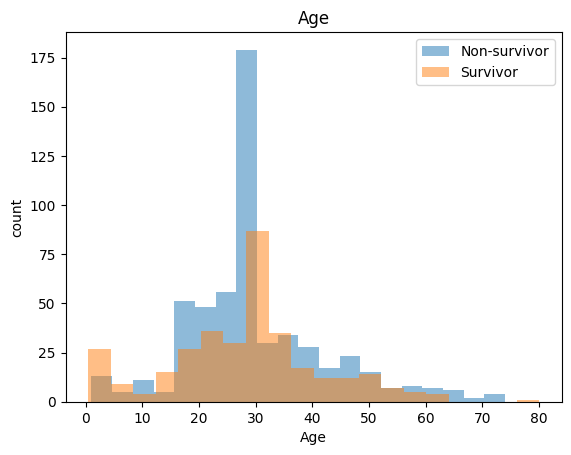

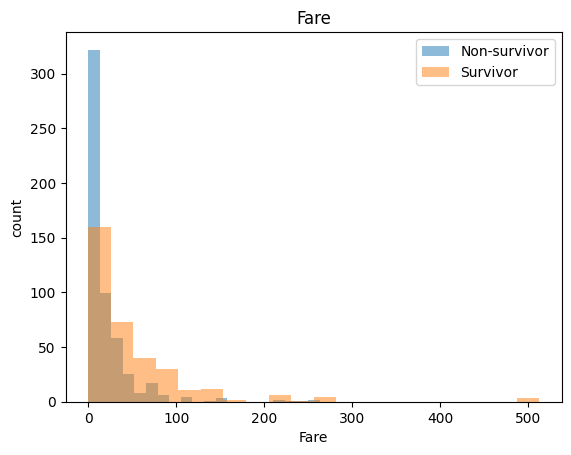

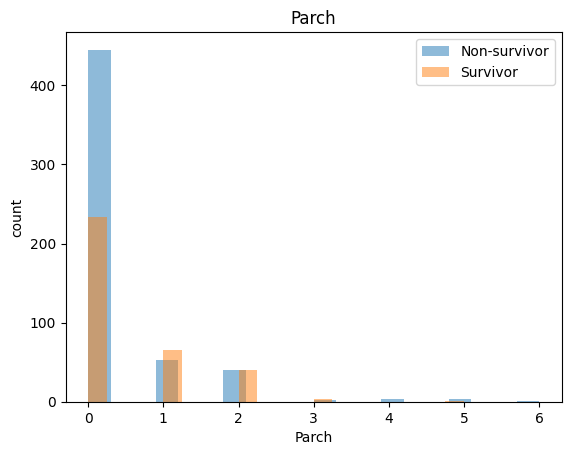

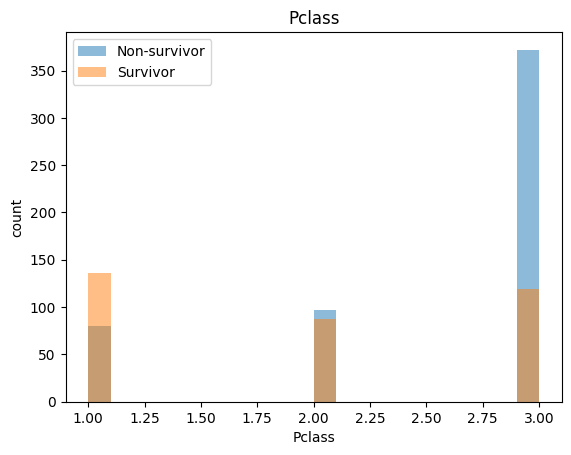

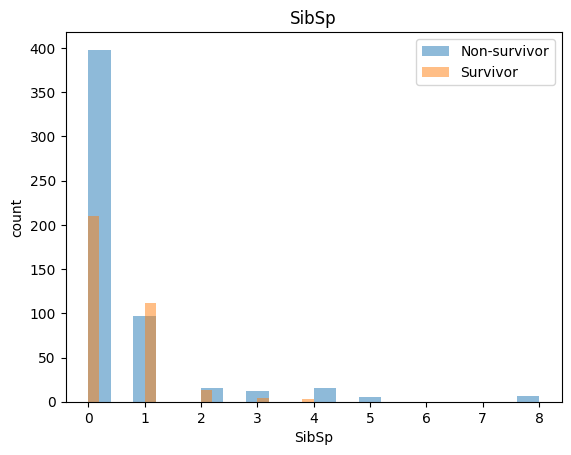

...

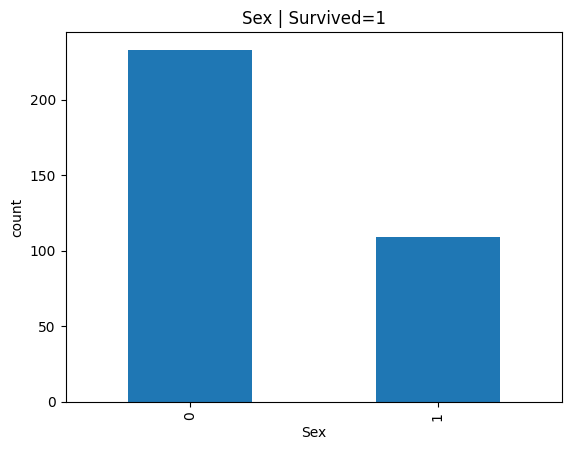

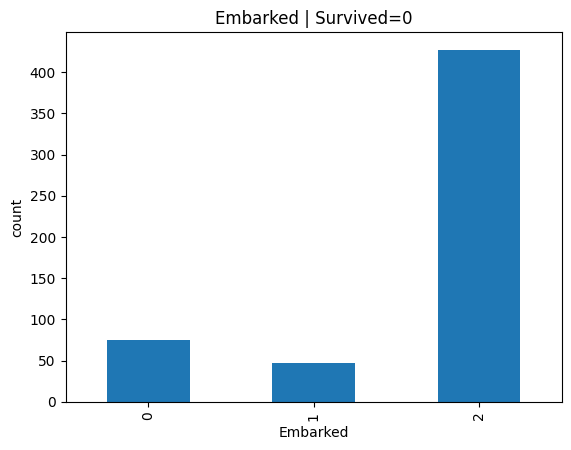

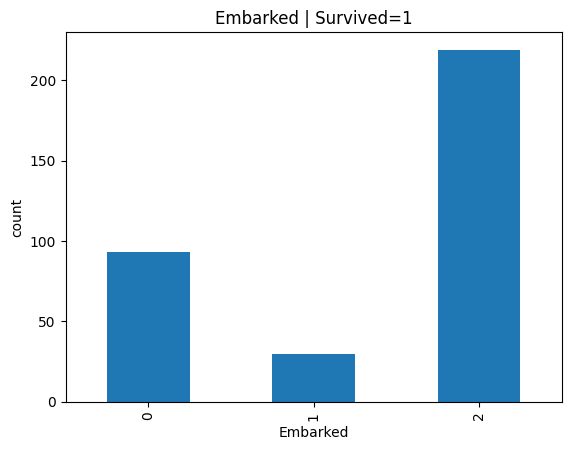

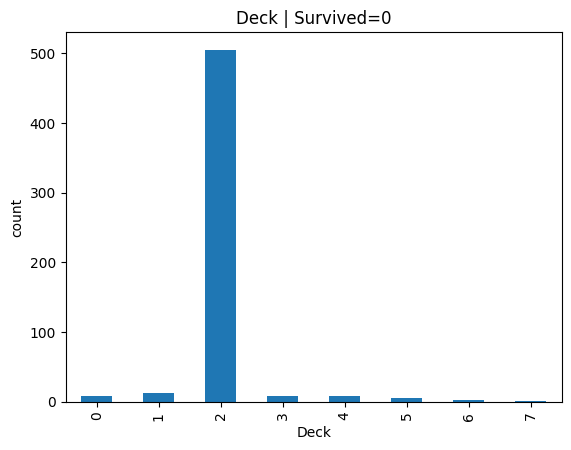

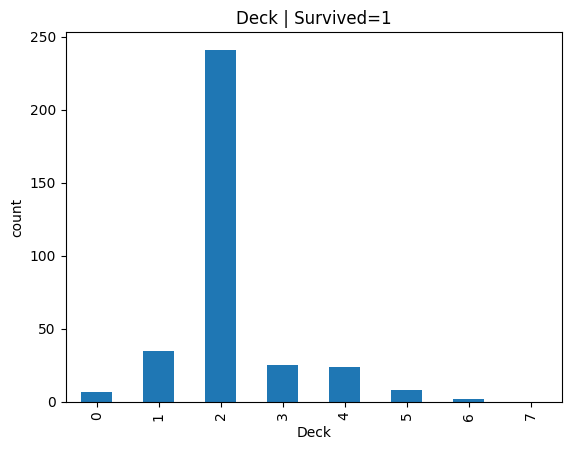

In [50]:
# Use this cell for your codeprint("=== Categorical distributions by Survived ===")

for c in cat_cols:
    print(f"\n[{c}]")
    display(df.groupby("Survived")[c].value_counts(dropna=False).unstack(fill_value=0))

print("\n=== Numerical medians by Survived ===")
display(df.groupby("Survived")[num_cols].median(numeric_only=True))

for col in num_cols:
    s0 = df.loc[df["Survived"]==0, col].dropna()
    s1 = df.loc[df["Survived"]==1, col].dropna()
    plt.figure()
    plt.hist(s0, bins=20, alpha=0.5, label="Non-survivor")
    plt.hist(s1, bins=20, alpha=0.5, label="Survivor")
    plt.title(col)
    plt.xlabel(col); plt.ylabel("count"); plt.legend()
    plt.show()

for c in cat_cols:
    ct = df.groupby(["Survived", c]).size().unstack(fill_value=0)
    for surv in ct.index:
        plt.figure()
        ct.loc[surv].plot(kind="bar")
        plt.title(f"{c} | Survived={surv}")
        plt.xlabel(c); plt.ylabel("count")
        plt.show()


4. Next, let's continue the analysis by looking into pairwise and multivariate relationships between the variables in the two groups. Try to visualize two variables at a time using, e.g., scatter plots and use a different color to encode the survival status.

    <span style="font-weight: 500">*Hint 1: You can also check out Seaborn's pairplot function, if you wish.*</span>

    <span style="font-weight: 500">*Hint 2: To better show many data points with the same value for a given variable, you can use either transparency or ‘jitter’.*</span>

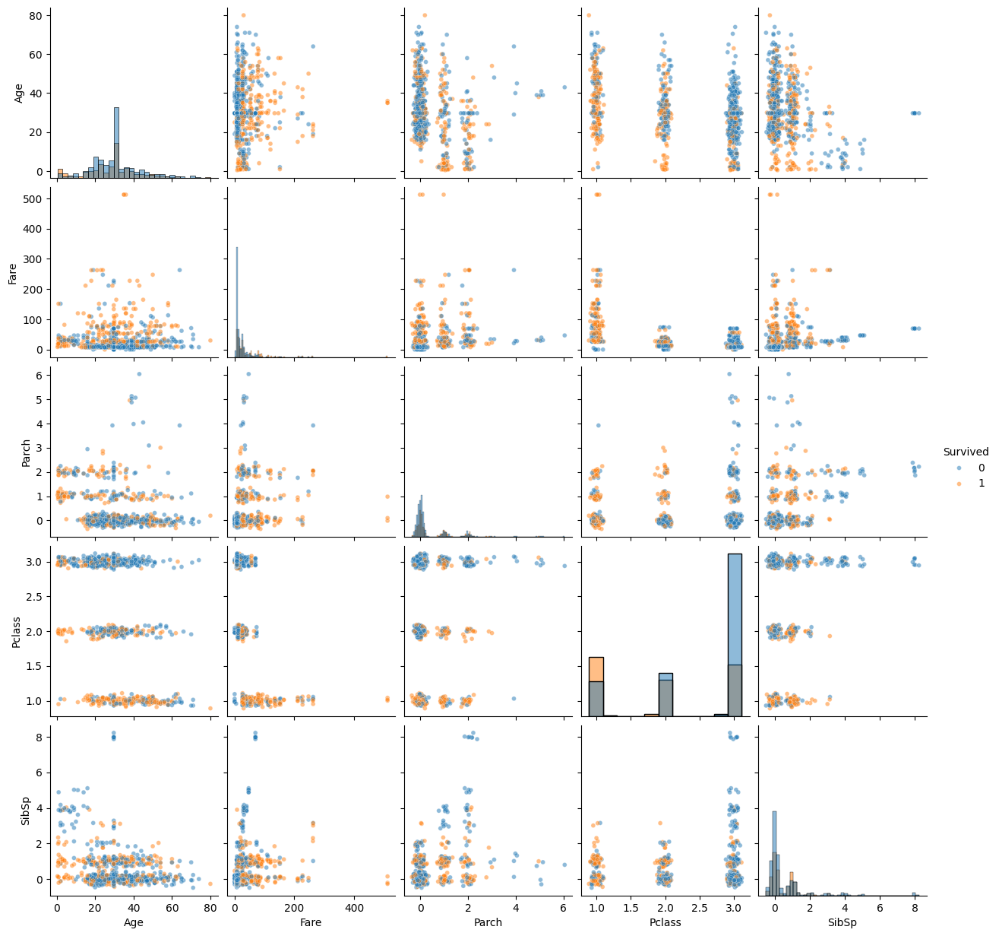

In [51]:
# Use this cell for your code
import seaborn as sns
features = [c for c in num_cols if c != "Survived"]

df2 = df.copy()
def is_discrete_like(s):
    return (np.issubdtype(s.dtype, np.integer)) or (s.nunique(dropna=True) <= 12)

rng = np.random.default_rng(42)
for col in features:
    s = df2[col]
    if is_discrete_like(s):
        span = (np.nanmax(s) - np.nanmin(s)) or 1.0
        noise = rng.normal(scale=0.02 * span, size=len(s))
        df2[col] = s.astype(float) + noise

sns.pairplot(
    df2,
    vars=features,
    hue="Survived",
    diag_kind="hist",                 
    plot_kws=dict(alpha=0.5, s=18),  
    corner=False                      
)


5. Finally, recall the preprocessing we did in the first exercise. What can you say about the effect of the choices that were made to use the mode and mean to impute missing values, instead of, for example, ignoring passengers with missing data?

*Use this (markdown) cell for your written answer*

I'd say the preprocessing pulls all the data more to the center especially the age for example.

**Remember to submit your code on the MOOC platform. You can return this Jupyter notebook (.ipynb) or .py, .R, etc depending on your programming preferences.**

## Exercise 3 | Working with text data 2.0

This exercise is related to the second exercise from last week. Find the saved <span style="font-weight: 500">pos.txt</span> and <span style="font-weight: 500">neg.txt</span> files, or, alternatively, you can find the week 1 example solutions on the MOOC platform after Tuesday.

1. Find the most common words in each file (positive and negative). Examine the results. Do they tend to be general terms relating to the nature of the data? How well do they indicate positive/negative sentiment?

In [52]:
# Use this cell for your code
from pathlib import Path
from collections import Counter
import math


pos = Path("pos.txt").read_text(encoding="utf-8").split()
neg = Path("neg.txt").read_text(encoding="utf-8").split()


cp = Counter(pos)
cn = Counter(neg)




2. Compute a [TF/IDF](https://en.wikipedia.org/wiki/Tf–idf) vector for each of the two text files, and make them into a <span style="font-weight: 500">2 x m</span> matrix, where <span style="font-weight: 500">m</span> is the number of unique words in the data. The problem with using the most common words in a review to analyze its contents is that words that are common overall will be common in all reviews (both positive and negative). This means that they probably are not good indicators about the sentiment of a specific review. TF/IDF stands for Term Frequency / Inverse Document Frequency (here the reviews are the documents), and is designed to help by taking into consideration not just the number of times a term occurs (term frequency), but also how many times a word exists in other reviews as well (inverse document frequency). You can use any variant of the formula, as well as off-the-shelf implementations. <span style="font-weight: 500">*Hint: You can use [sklearn](http://scikit-learn.org/).*</span>

In [53]:
# Use this cell for your code

from sklearn.feature_extraction.text import TfidfVectorizer

docs = [
    Path("pos.txt").read_text(encoding="utf-8"),
    Path("neg.txt").read_text(encoding="utf-8"),
]
labels = ["pos", "neg"]


vec = TfidfVectorizer(lowercase=False, token_pattern=r"(?u)\b\w+\b",
                      use_idf=True, smooth_idf=True, norm="l2")
X = vec.fit_transform(docs)              
vocab = vec.get_feature_names_out()

tfidf = pd.DataFrame(X.toarray(), index=labels, columns=vocab)
print("TF-IDF shape:", tfidf.shape)

with pd.option_context("display.max_rows", None,
                       "display.max_columns", None,
                       "display.float_format", "{:.4f}".format):
    print(tfidf)   


TF-IDF shape: (2, 235618)
         0     00    000   0000  00000  000000  00000000  \
pos 0.0007 0.0004 0.0001 0.0000 0.0000  0.0000    0.0000   
neg 0.0029 0.0002 0.0002 0.0001 0.0000  0.0000    0.0000   

     000000000000000000058  000000000000002  00000000004  0000001  00000042  \
pos                 0.0000           0.0000       0.0000   0.0000    0.0000   
neg                 0.0000           0.0000       0.0000   0.0000    0.0000   

     000001  00001  00004  00005  00005anbspand  00006  0000833333  0000ga  \
pos  0.0000 0.0000 0.0000 0.0000         0.0000 0.0000      0.0000  0.0000   
neg  0.0000 0.0000 0.0000 0.0000         0.0000 0.0000      0.0000  0.0000   

      0001  00011  00012  00014  00015  00016  0001632401  00018  000182pk  \
pos 0.0000 0.0000 0.0000 0.0000 0.0000 0.0000      0.0000 0.0000    0.0000   
neg 0.0000 0.0000 0.0000 0.0000 0.0000 0.0000      0.0000 0.0000    0.0000   

     00019   0002  00025  00026  00026w  00028   0003  00030  00036  0003c  \
pos 0.0

3. List the words with the highest TF/IDF score in each class (positive | negative), and compare them to the most common words. What do you notice? Did TF/IDF work as expected?

In [54]:
# Use this cell for your code
from sklearn.feature_extraction.text import CountVectorizer
N = 15 


for i, lab in enumerate(labels):
    row = X[i].toarray().ravel()
    top_idx = np.argsort(row)[::-1][:N]
    print(f"\nTop TF-IDF — {lab}")
    for w, s in zip(vocab[top_idx], row[top_idx]):
        print(f"{w}\t{s:.4f}")


cv = CountVectorizer(lowercase=False, token_pattern=vec.token_pattern, vocabulary=vec.vocabulary_)
C = cv.transform(docs)
vocab_arr = np.array(vocab)

for i, lab in enumerate(labels):
    row = C[i].toarray().ravel()
    top_idx = np.argsort(row)[::-1][:N]
    print(f"\nMost common — {lab}")
    for w, c in zip(vocab_arr[top_idx], row[top_idx]):
        print(f"{w}\t{int(c)}")


Top TF-IDF — pos
great	0.3660
work	0.3591
use	0.2898
good	0.2447
fit	0.2296
instal	0.1926
product	0.1764
look	0.1523
just	0.1515
like	0.1475
easi	0.1367
light	0.1237
car	0.1236
price	0.1216
need	0.1146

Top TF-IDF — neg
work	0.2995
use	0.2788
fit	0.2343
product	0.1826
just	0.1765
light	0.1715
like	0.1549
time	0.1472
look	0.1409
instal	0.1401
did	0.1381
good	0.1295
dont	0.1283
buy	0.1264
car	0.1250

Most common — pos
great	435906
work	427780
use	345233
good	291448
fit	273505
instal	229408
product	210084
look	181401
just	180420
like	175725
easi	162864
light	147321
car	147195
price	144891
need	136519

Most common — neg
work	39998
use	37244
fit	31293
product	24394
just	23580
light	22907
like	20685
time	19665
look	18824
instal	18709
did	18446
good	17295
dont	17136
buy	16885
car	16694


4. Plot the words in each class with their corresponding TF/IDF scores. Note that there will be a lot of words, so you’ll have to think carefully to make your chart clear! If you can’t plot them all, plot a subset – think about how you should choose this subset.

    <span style="font-weight: 500">*Hint: you can use word clouds. But feel free to challenge yourselves to think of any other meaningful way to visualize this information!*</span>

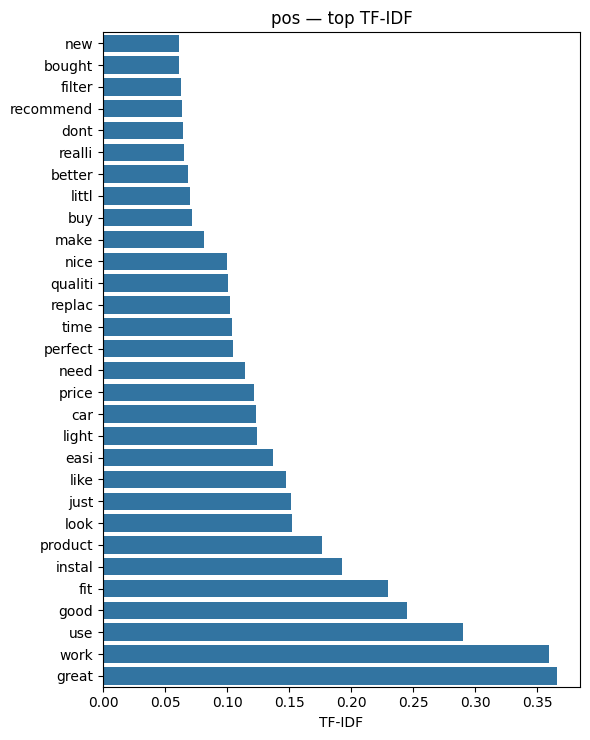

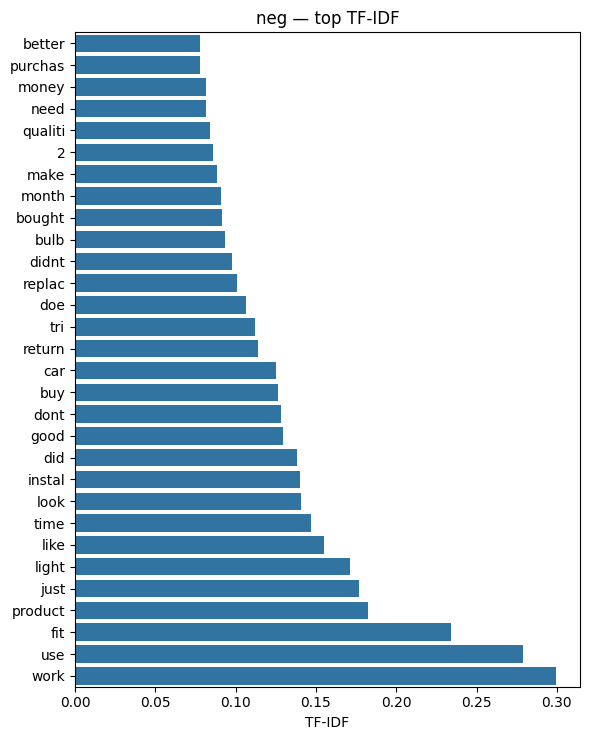

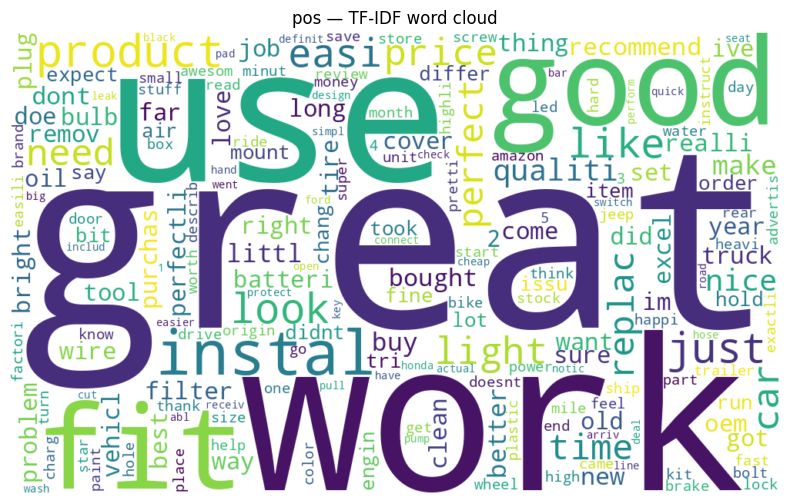

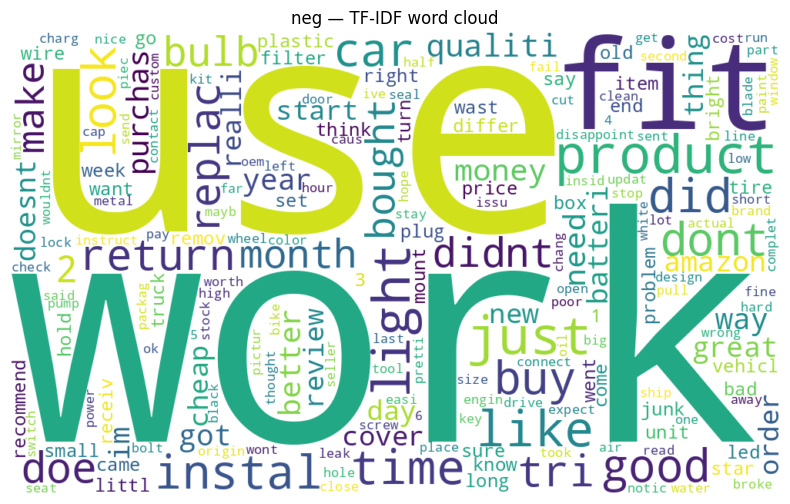

In [55]:
# Use this cell for your code
from wordcloud import WordCloud
TOP = 30  # adjust as needed
for label in tfidf.index:
    s = tfidf.loc[label].sort_values(ascending=False).head(TOP)[::-1]
    plt.figure(figsize=(6, max(4, 0.25*len(s))))
    sns.barplot(x=s.values, y=s.index)
    plt.title(f'{label} — top TF-IDF')
    plt.xlabel('TF-IDF'); plt.ylabel('')
    plt.tight_layout(); plt.show()


for label in tfidf.index:
    wc = WordCloud(width=1000, height=600, background_color='white')
    wc = wc.generate_from_frequencies(tfidf.loc[label].to_dict())
    plt.figure(figsize=(10,6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'{label} — TF-IDF word cloud')
    plt.show()


**Remember to submit your code on the MOOC platform. You can return this Jupyter notebook (.ipynb) or .py, .R, etc depending on your programming preferences.**

## Exercise 4 | Junk charts

There’s a thriving community of chart enthusiasts who keep looking for statistical graphics that they find inappropriate, and which they call “junk charts”, and who often also propose ways to improve them.

1. Find at least three statistical visualizations you think are not very good and identify their problems. Copying examples from various junk chart websites is not accepted – you should find your own junk charts, out in the wild. You should be able to find good (or rather, bad) examples quite easily since a significant fraction of charts can have at least *some* issues. The examples you choose should also have different problems, e.g., try to avoid collecting three bar charts, all with problematic axes. Instead, try to find as interesting and diverse examples as you can.

2. Try to produce improved versions of the charts you selected. The data is of course often not available, but perhaps you can try to extract it, at least approximately, from the chart. Or perhaps you can simulate data that looks similar enough to make the point.



**Submit a PDF with all the charts (the ones you found and the ones you produced).**